# Robustness: Different priors for omega gender

In this notebook we want to analyse the effect of different priors on the effect size.

In [2]:
import pickle
import sys
import matplotlib.pyplot as plt
import numpy as np
from tqdm.auto import tqdm
import os
import pandas as pd
import datetime
import matplotlib.ticker as ticker
import pymc3 as pm
import arviz as az
sys.path.append("../../../")
sys.path.append("../../../covid19_inference")

import covid19_soccer
from covid19_soccer.plot.utils import get_from_trace
import covid19_inference as cov19
#import covid19_inference as cov19
sys.path.append("../../")
from header_plotting import *

%load_ext autoreload
%autoreload 2

In [3]:
def load_function(country, offset=0, mwd="1.0", interval_cps="10.0", f_fem="0.33", f_robust="1.0", len="normal"):
        fstr=lambda tune, draws, max_treedepth, folder: (f"/data.nst/share/soccer_project/{folder}/run"+
            f"-beta=False"+
            f"-country={country}"+
            f"-offset_data={offset}"+
            f"-prior_delay=-1"+
            f"-median_width_delay={mwd}"+
            f"-interval_cps={interval_cps}"+
            f"-f_fem={f_fem}"+
            f"-len=normal"+
            f"-abs_sine=False"+
            f"-t={tune}"+
            f"-d={draws}"+
            f"-max_treedepth={max_treedepth}.pkl")
        if not f_robust == "1.0":
            fstr=lambda tune, draws, max_treedepth, folder: (f"/data.nst/share/soccer_project/covid_uefa_traces14/run"+
                f"-beta=False"+
                f"-country={country}"+
                f"-offset_data={offset}"+
                f"-prior_delay=-1"+
                f"-median_width_delay={mwd}"+
                f"-interval_cps={interval_cps}"+
                f"-f_fem={f_fem}"+
                f"-len=normal"+
                f"-abs_sine=False"+
                f"-t={tune}"+
                f"-d={draws}"+
                f"-max_treedepth={max_treedepth}.pkl")
        model = None
        
        tune, draws, max_treedepth = (2000, 4000, 12)
        folder="covid_uefa_traces14"
        if os.path.exists(fstr(tune, draws, max_treedepth, folder)):
            model, trace = load(fstr(tune, draws, max_treedepth, folder))
            print(f"Use {draws} sample runs for {country}")
            
        tune, draws, max_treedepth = (1000, 2000, 12)
        folder="covid_uefa_traces15"
        if os.path.exists(fstr(tune, draws, max_treedepth, folder)):
            model, trace = load(fstr(tune, draws, max_treedepth, folder))
            print(f"Use {draws} sample runs for {country}")
        tune, draws, max_treedepth = (500, 1000, 12)
        if os.path.exists(fstr(tune, draws, max_treedepth, folder)):
            model, trace = load(fstr(tune, draws, max_treedepth, folder))
            print(f"Use {draws} sample runs for {country}")
        
        if model is None: 
            print(fstr(tune, draws, max_treedepth, folder), " not found")
            return None, None
        
        # Remove chains with likelihood larger than -200, should only be the case for 2 chains in France
        mask = (np.mean(trace.sample_stats.lp, axis=1)>-200)
        trace.posterior = trace.posterior.sel(chain=~mask)
        return model, trace

In [4]:
save_kwargs = {
    "transparent":True,
    "dpi":300,
    "bbox_inches":"tight"
}
fig_path = "../../../figures/SI/robustness"

def load(fstr):
    with open(fstr, "rb") as f:
         return pickle.load(f)


In [5]:
countries = ['England', 'Czechia', 'Scotland', 'Spain', 'Italy', 'Slovakia',
       'Germany', 'Austria', 'Belgium', 'France', 'Portugal',
       'Netherlands']
tune = 2000
draws = 4000
max_treedepth = 12
traces, models, dls = {}, {}, {}
for country in tqdm(countries):
    models_t, traces_t, dls_t = [],[],[]
    for omega_gender in [0.2, 0.33, 0.5]:
        model,trace = load_function(country, f_fem= omega_gender)

        dl = covid19_soccer.dataloader.Dataloader_gender(countries=[country])
        models_t.append(model)
        traces_t.append(trace)
        dls_t.append(dl)
    models[country] = models_t
    traces[country] = traces_t
    dls[country] = dls_t

  0%|          | 0/12 [00:00<?, ?it/s]

Use 4000 sample runs for England
Use 4000 sample runs for England
Use 4000 sample runs for England
Use 4000 sample runs for Czechia
Use 4000 sample runs for Czechia
Use 4000 sample runs for Czechia
Use 4000 sample runs for Scotland
Use 4000 sample runs for Scotland
Use 4000 sample runs for Scotland
Use 4000 sample runs for Spain
Use 4000 sample runs for Spain
Use 4000 sample runs for Spain
Use 4000 sample runs for Italy
Use 4000 sample runs for Italy
Use 4000 sample runs for Italy
Use 4000 sample runs for Slovakia
Use 4000 sample runs for Slovakia
Use 2000 sample runs for Slovakia
Use 4000 sample runs for Slovakia
Use 4000 sample runs for Germany
Use 4000 sample runs for Germany
Use 4000 sample runs for Germany
Use 4000 sample runs for Austria
Use 4000 sample runs for Austria
Use 2000 sample runs for Austria
Use 4000 sample runs for Austria
Use 4000 sample runs for Belgium
Use 4000 sample runs for Belgium
Use 2000 sample runs for Belgium
Use 4000 sample runs for Belgium
Use 4000 sample

[2 1 0]
Country	50.0	2.5	97.5	16	84	>0
England0	10.921084424270642	4.906068368382088	18.74720878521213	6.236394122063502	15.171060599251831	1.0
England1	11.63443245801039	5.200797846338837	21.08523519210525	6.57475768050027	15.662250325694123	1.0
England2	11.803907510556567	5.2317916172461665	22.27311221307023	6.605404578339818	15.930030141479744	1.0


WARNING  [matplotlib.font_manager] findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
WARNING  [matplotlib.font_manager] findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
WARNING  [matplotlib.font_manager] findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
WARNING  [matplotlib.font_manager] findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
WARNING  [matplotlib.font_manager] findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
WARNING  [matplotlib.font_manager] findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial


[2 1 0]
Country	50.0	2.5	97.5	16	84	>0
Czechia0	7.654240934080031	0.8060157903978781	15.630949572275245	3.264682506258048	12.099963644949698	0.99665625
Czechia1	9.603474390276293	3.2795081350497863	16.123752499407065	6.41683863577033	12.840731964945519	0.99915625
Czechia2	9.87592779884358	3.429780583953335	15.942275452109946	6.8723982907305	12.806350273612793	0.997375
[2 1 0]
Country	50.0	2.5	97.5	16	84	>0
Scotland0	3.1106589710398804	1.0683313482535648	7.908436777672121	1.4509696145113435	6.773974219078614	1.0
Scotland1	3.1979680391662284	1.223489785101772	7.996899039919895	1.6184503854353787	6.834215753826618	1.0
Scotland2	3.38318036267615	1.125001425144984	8.01948763347322	1.5328976560963987	6.843204315869322	1.0
[2 1 0]
Country	50.0	2.5	97.5	16	84	>0
Spain0	1.7077049979511534	-0.24340594992273662	5.852902138874421	0.4759387807245604	3.429861298655418	0.960875
Spain1	2.4564172603115786	-1.0696901018258729	8.076729583188397	0.6338443266965555	4.967150536935893	0.9109375
Spain2	2.7298

WARNING  [matplotlib.font_manager] findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
WARNING  [matplotlib.font_manager] findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial


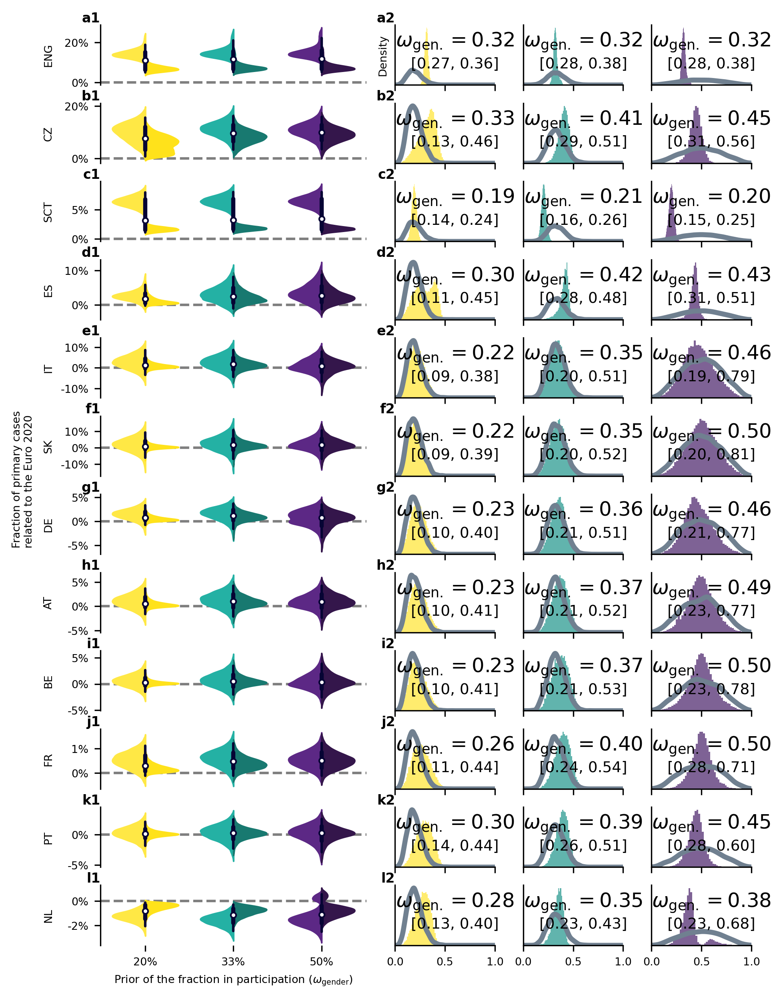

In [6]:
from covid19_soccer.plot.utils import lighten_color
from covid19_soccer.plot.rcParams import *
from matplotlib.colors import to_hex
import string

# Define figure 
fig, axes = plt.subplots(len(countries),4,figsize=(7,len(countries)*0.83),gridspec_kw={"width_ratios":[0.8,0.3,0.3,0.3],"hspace":0.3})

# Define colors for male and female violin plots
colors_base = ["#ffe530","#1e958a","#481f68"]
l = 0.9
d = 1.1
colors_mf = []
for col in colors_base:
    colors_mf.append(to_hex(lighten_color(col,l)))
    colors_mf.append(to_hex(lighten_color(col,d)))
colors_mf = np.array(colors_mf)

# Iterate all countries and create a violin plot
for i, country in enumerate(countries):
    covid19_soccer.plot.other.soccer_related_cases_overview(
        ax=axes[i,0],
        traces=traces[country],
        models=models[country],
        dls=dls[country],
        country_order=[0,1,2],
        remove_outliers=True,
        colors=colors_mf,
        bw=.15
        )
    axes[i,0].set_xticklabels(["20%","33%","50%"])
    axes[i,0].set_ylabel(dls[country][0].countries_iso2[0].replace("GB-",""))

    if i != len(countries)-1:
        axes[i,0].set_xticklabels([])
        axes[i,0].tick_params(bottom=False)

    for j, (trace, model , dl, color,ls) in enumerate(zip(traces[country], models[country], dls[country], colors_base, [(0, (5, 7)),"dashed","-"])):
        
        if j == 2:
            axes[i,j+1].set_xlim(0,1)
        else:
            axes[i,j+1].set_xlim(0,1)
        rcParams.color_posterior=colors_base[j]
        covid19_soccer.plot.distributions.distribution(
            model,
            trace,
            "factor_female",
            nSamples_prior=5000,
            title="",
            dist_math="\omega_\mathrm{gen.}",
            ax=axes[i,j+1],
        )
        if i != len(countries)-1:
            axes[i,j+1].set_xticklabels([])
        axes[i,j+1].tick_params(left=False)
            
# Array of letters
alphabet_string = list(string.ascii_lowercase)

# Add label letters to figure
for i, country in enumerate(countries):
    axes[i,0].text(
        0,
        1.22,
        alphabet_string[i]+"1",
        transform=axes[i,0].transAxes,
        fontsize=8,
        fontweight="bold",
        verticalalignment="top",
        ha="right",
    )
    axes[i,1].text(
        0,
        1.22,
        alphabet_string[i]+"2",
        transform=axes[i,1].transAxes,
        fontsize=8,
        fontweight="bold",
        verticalalignment="top",
        ha="right",
    )

# Set ylims
"""
ylims = {
    "England":[-8,25],
    "Czechia":[-8,25],
    "Italy":[-8,25],
    "Scotland":[-8,25],
    "Spain":[-8,25],
    "Germany":[-8,25],
    "France":[-8,25],
    'Slovakia':[-30,50],
    'Austria':[-8,25],
    'Belgium':[-8,25],
    'Portugal':[-8,25],
    'Netherlands':[-8,25],
}
for i, country in enumerate(countries):
    axes[i,0].set_ylim(ylims[country])
"""

# Set labels
fig.supylabel("Fraction of primary cases\nrelated to the Euro 2020")
axes[0,1].set_ylabel("Density")
axes[-1,0].set_xlabel("Prior of the fraction in participation ($\omega_{\mathrm{gender}}$)")
fig.align_ylabels(axes[:,0])

# Save figure
plt.savefig(f"{fig_path}/robustness_omega_gender.pdf", **save_kwargs)
plt.savefig(f"{fig_path}/robustness_omega_gender.png", **save_kwargs)
plt.show()
plt.close(fig=fig)

## Extended overviews

/home/smohr/Repositories/covid19_soccer/notebooks/supplementary/robustness/../../../covid19_soccer/plot/other.py:1254: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  lines.append(Patch([0], [0], color=rcParams.color_posterior, lw=0,),)
/home/smohr/Repositories/covid19_soccer/notebooks/supplementary/robustness/../../../covid19_soccer/plot/other.py:1254: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  lines.append(Patch([0], [0], color=rcParams.color_posterior, lw=0,),)
WARNING  [matplotlib.font_manager] findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
WARNING  [matplotlib.font_manager] findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial


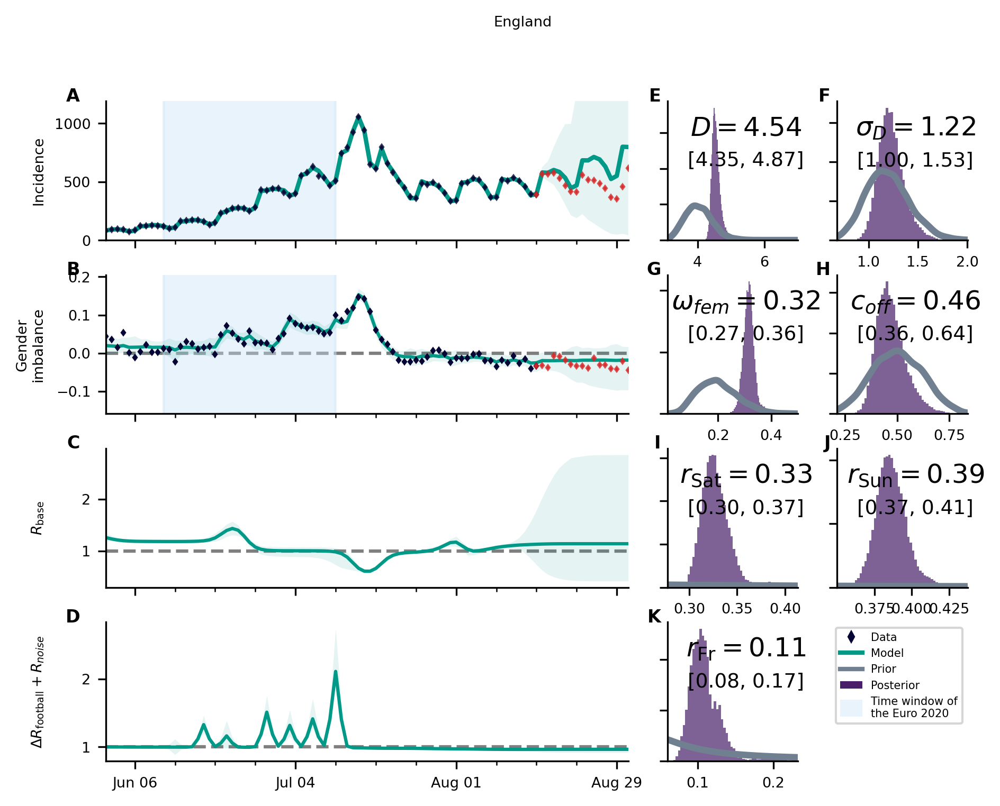

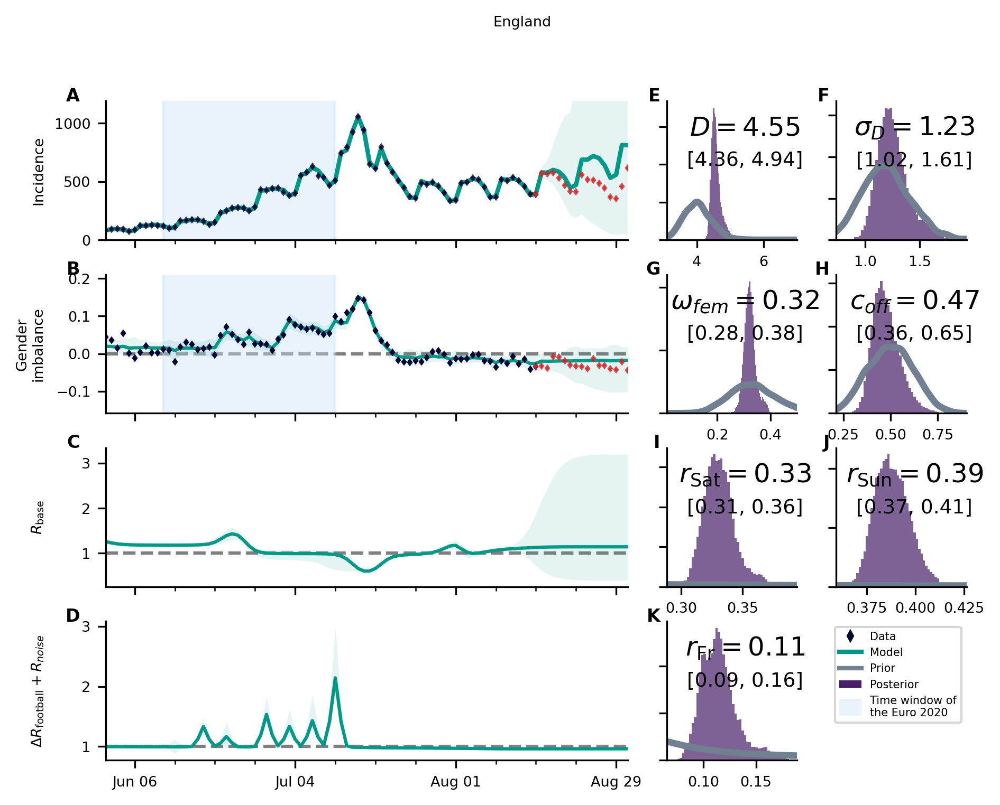

/home/smohr/Repositories/covid19_soccer/notebooks/supplementary/robustness/../../../covid19_soccer/plot/other.py:1254: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  lines.append(Patch([0], [0], color=rcParams.color_posterior, lw=0,),)
/home/smohr/Repositories/covid19_soccer/notebooks/supplementary/robustness/../../../covid19_soccer/plot/other.py:1254: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  lines.append(Patch([0], [0], color=rcParams.color_posterior, lw=0,),)


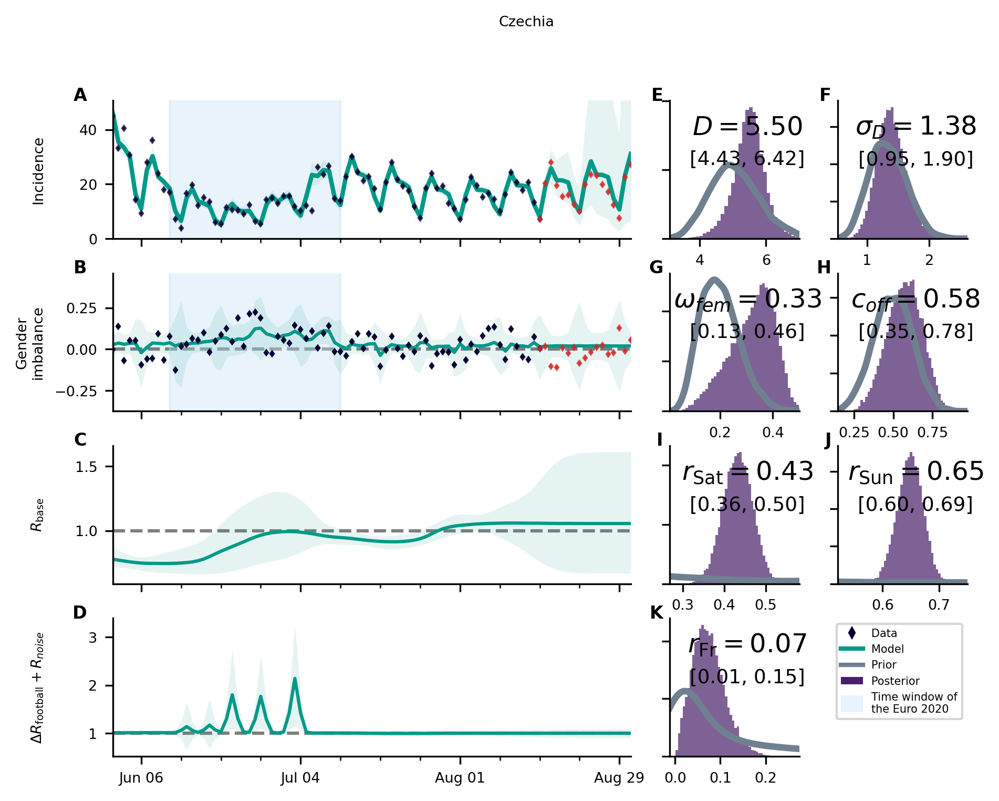

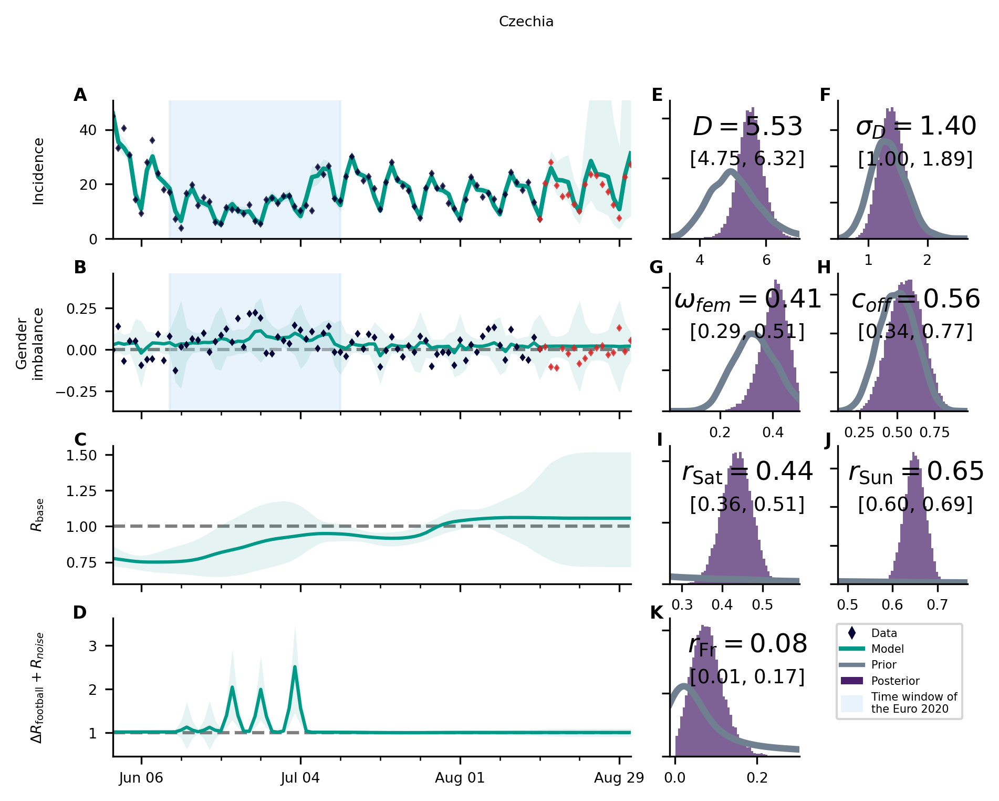

/home/smohr/Repositories/covid19_soccer/notebooks/supplementary/robustness/../../../covid19_soccer/plot/other.py:1254: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  lines.append(Patch([0], [0], color=rcParams.color_posterior, lw=0,),)
/home/smohr/Repositories/covid19_soccer/notebooks/supplementary/robustness/../../../covid19_soccer/plot/other.py:1254: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  lines.append(Patch([0], [0], color=rcParams.color_posterior, lw=0,),)


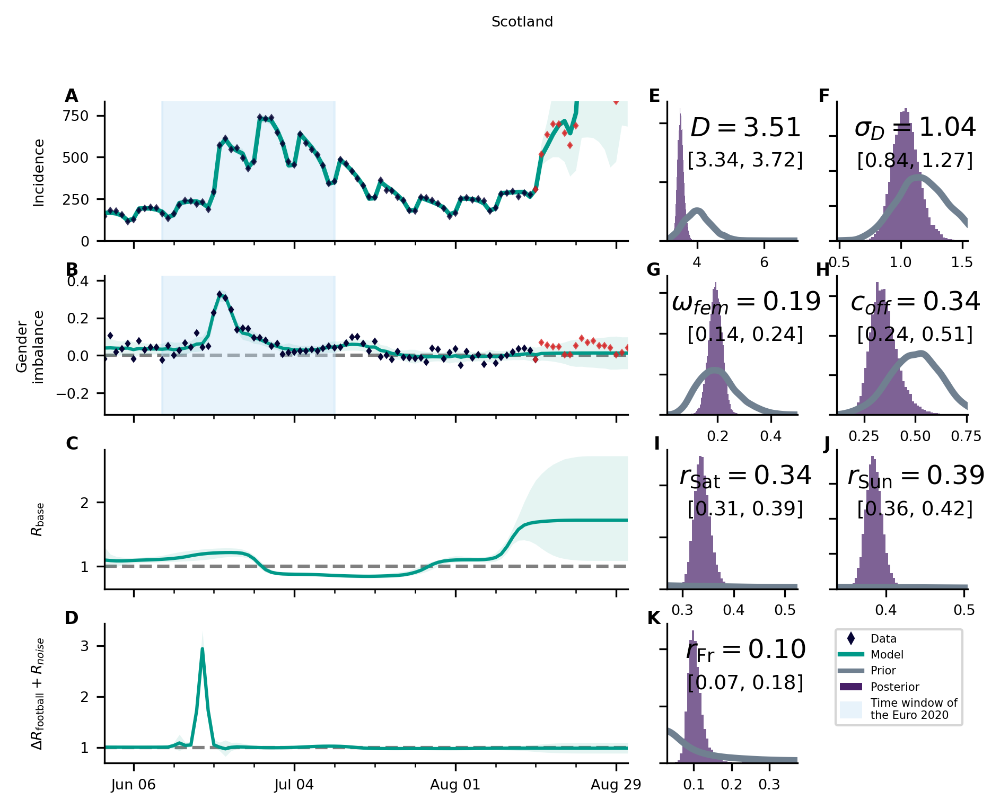

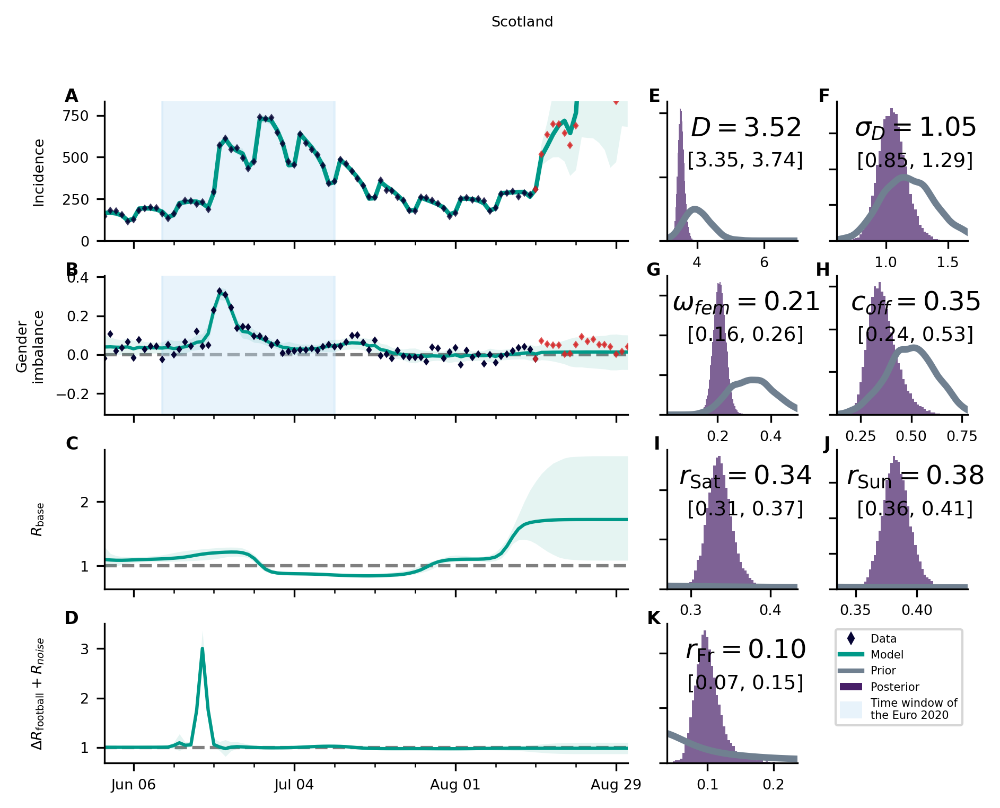

/home/smohr/Repositories/covid19_soccer/notebooks/supplementary/robustness/../../../covid19_soccer/plot/other.py:1254: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  lines.append(Patch([0], [0], color=rcParams.color_posterior, lw=0,),)
/home/smohr/Repositories/covid19_soccer/notebooks/supplementary/robustness/../../../covid19_soccer/plot/other.py:1254: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  lines.append(Patch([0], [0], color=rcParams.color_posterior, lw=0,),)


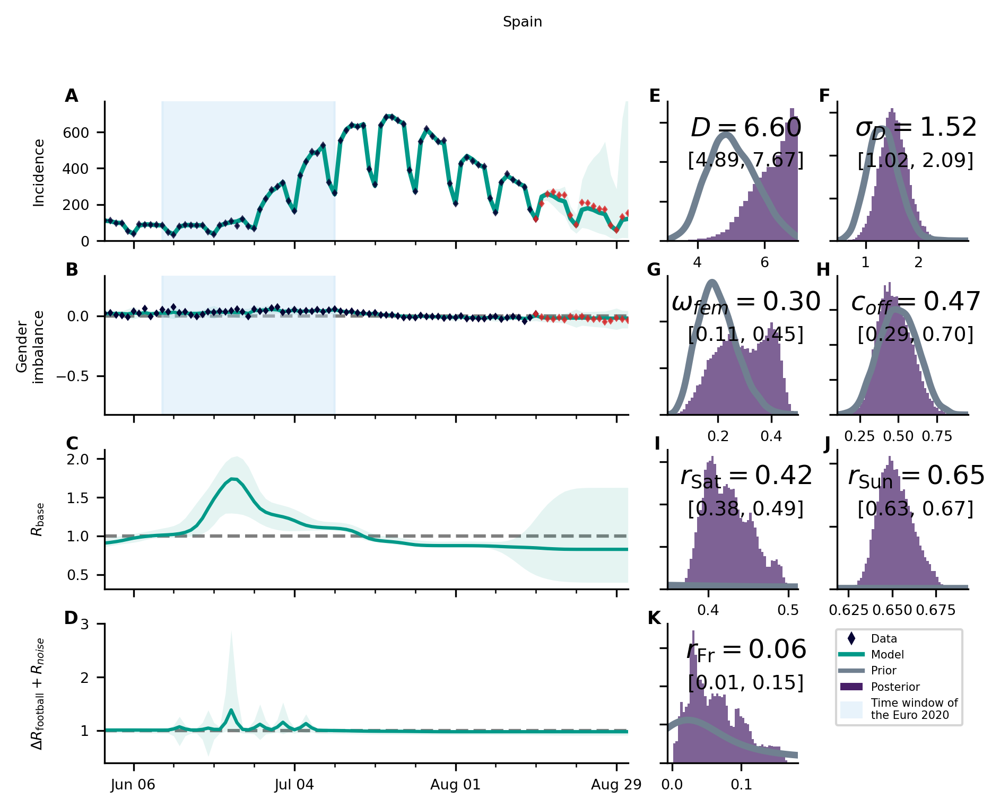

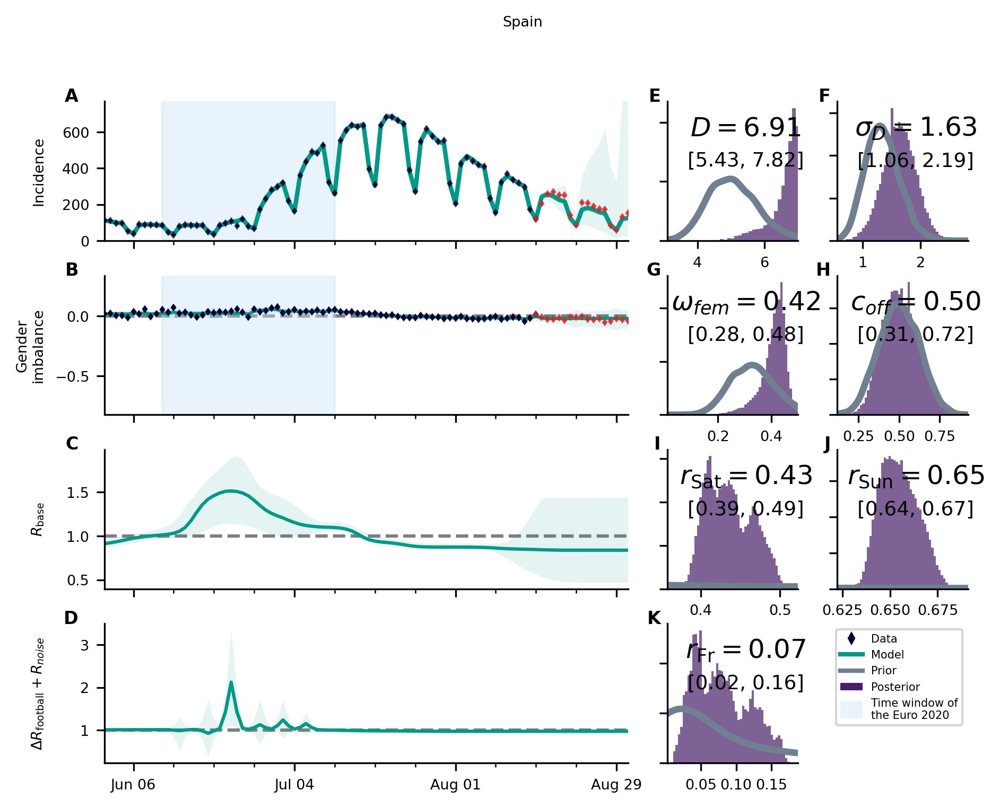

/home/smohr/Repositories/covid19_soccer/notebooks/supplementary/robustness/../../../covid19_soccer/plot/timeseries.py:157: RuntimeWarning: invalid value encountered in true_divide
  y=(
/home/smohr/Repositories/covid19_soccer/notebooks/supplementary/robustness/../../../covid19_soccer/plot/timeseries.py:182: RuntimeWarning: invalid value encountered in true_divide
  imbalance = (
/home/smohr/Repositories/covid19_soccer/notebooks/supplementary/robustness/../../../covid19_soccer/plot/other.py:1254: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  lines.append(Patch([0], [0], color=rcParams.color_posterior, lw=0,),)
/home/smohr/Repositories/covid19_soccer/notebooks/supplementary/robustness/../../../covid19_soccer/plot/timeseries.py:157: RuntimeWarning: invalid value encountered in true_divide
  y=(
/home/smohr/Repositories/covid19_soccer/notebooks/supplementary/robustness/../../../covid19_soccer/plot/timeseries.py:182: RuntimeWarning: invalid

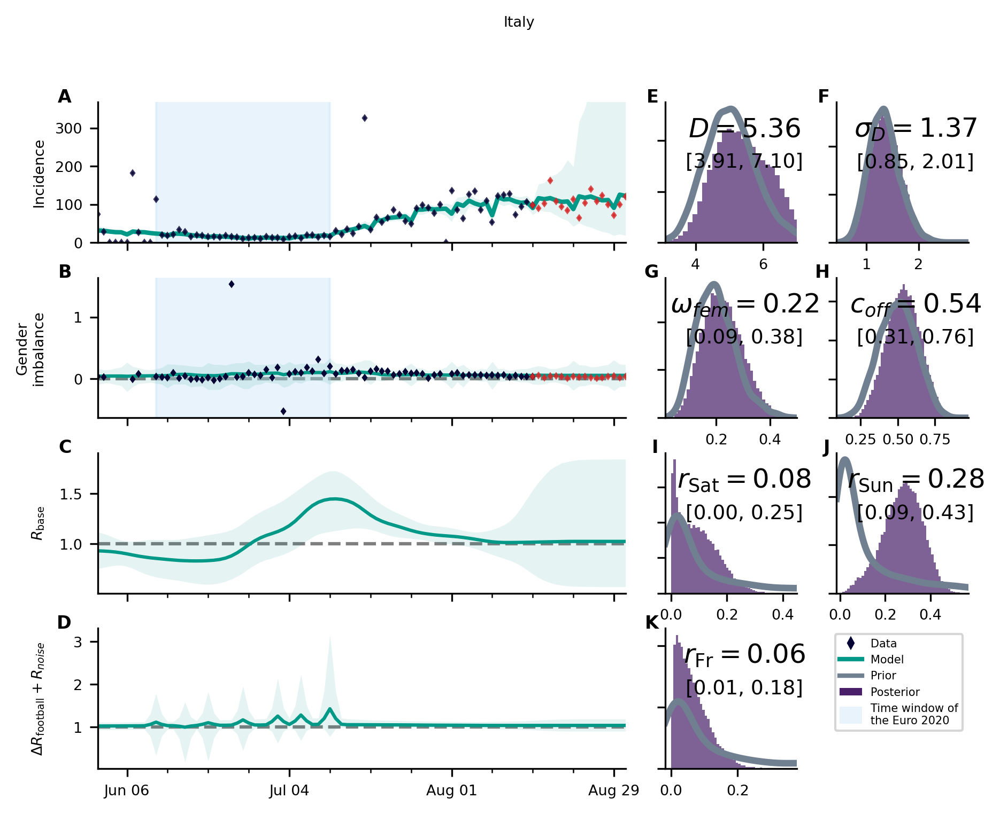

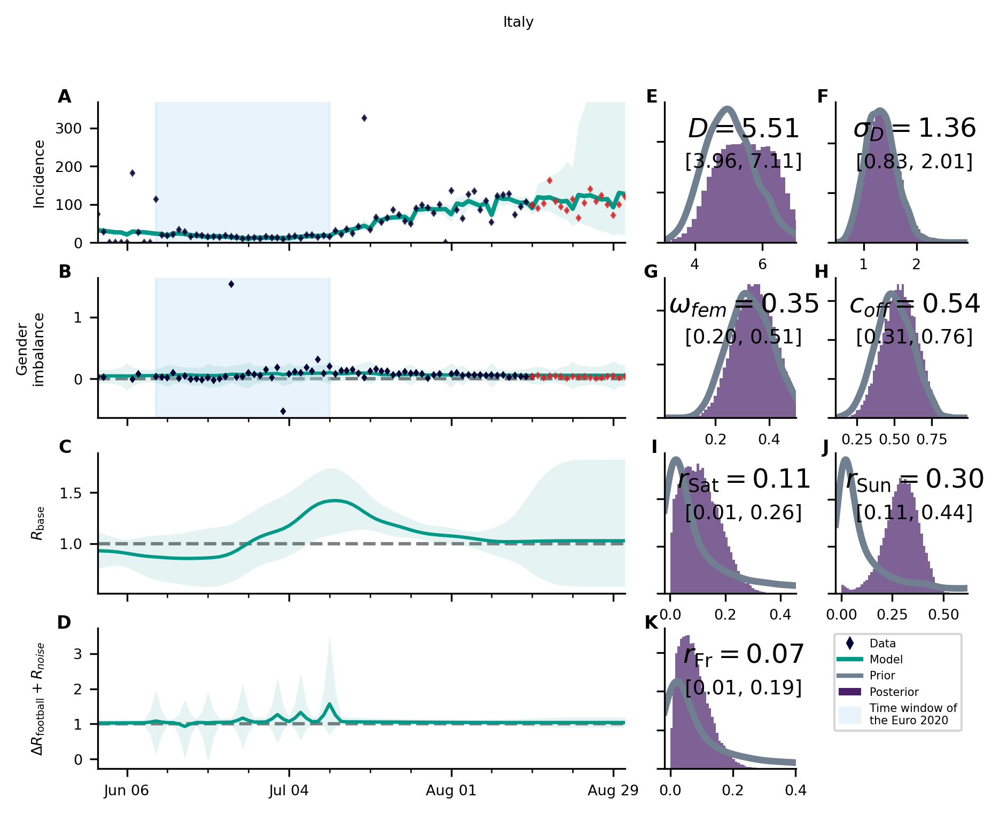

/home/smohr/Repositories/covid19_soccer/notebooks/supplementary/robustness/../../../covid19_soccer/plot/other.py:1254: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  lines.append(Patch([0], [0], color=rcParams.color_posterior, lw=0,),)
/home/smohr/Repositories/covid19_soccer/notebooks/supplementary/robustness/../../../covid19_soccer/plot/other.py:1254: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  lines.append(Patch([0], [0], color=rcParams.color_posterior, lw=0,),)


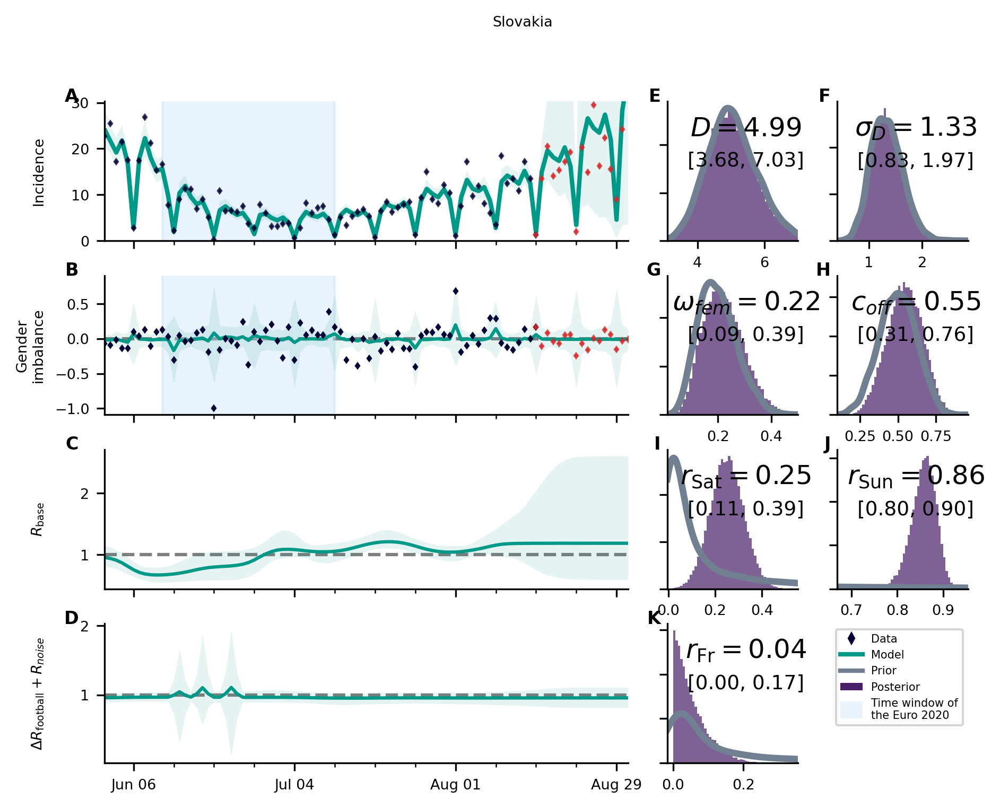

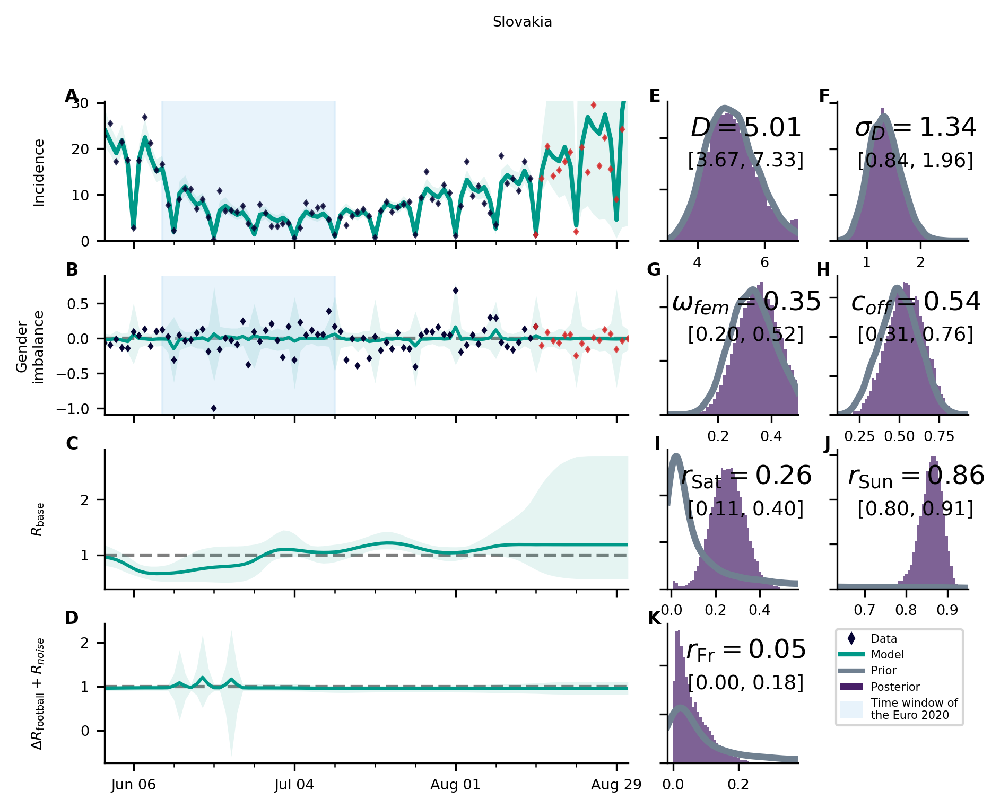

/home/smohr/Repositories/covid19_soccer/notebooks/supplementary/robustness/../../../covid19_soccer/plot/other.py:1254: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  lines.append(Patch([0], [0], color=rcParams.color_posterior, lw=0,),)
/home/smohr/Repositories/covid19_soccer/notebooks/supplementary/robustness/../../../covid19_soccer/plot/other.py:1254: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  lines.append(Patch([0], [0], color=rcParams.color_posterior, lw=0,),)


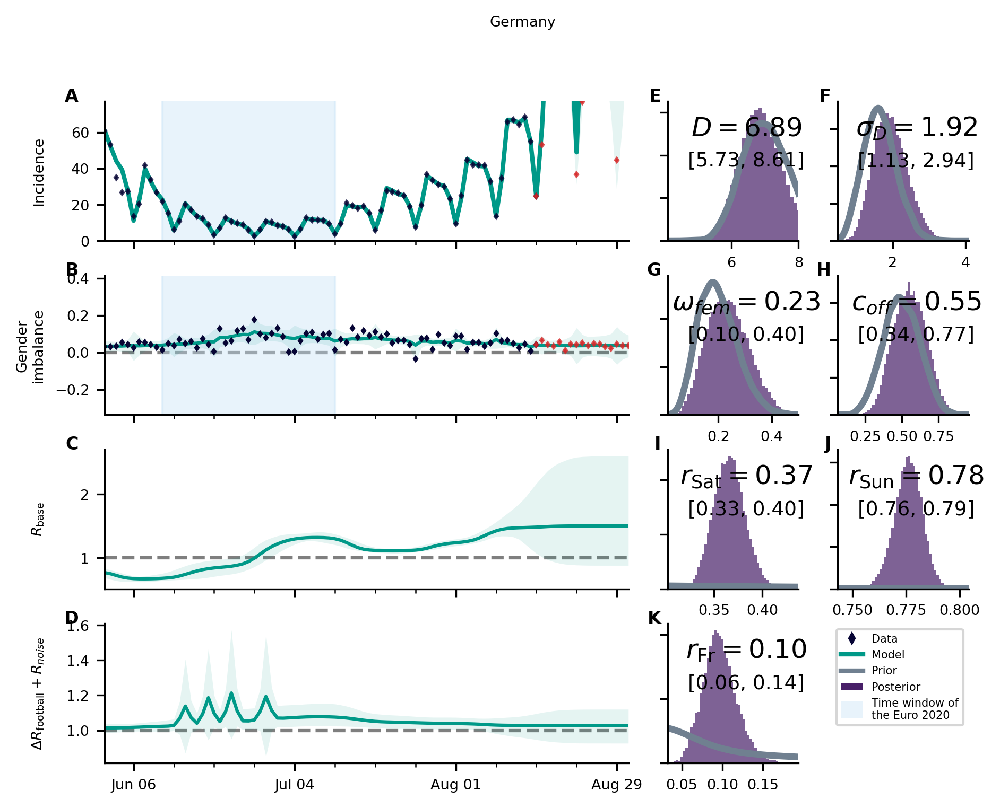

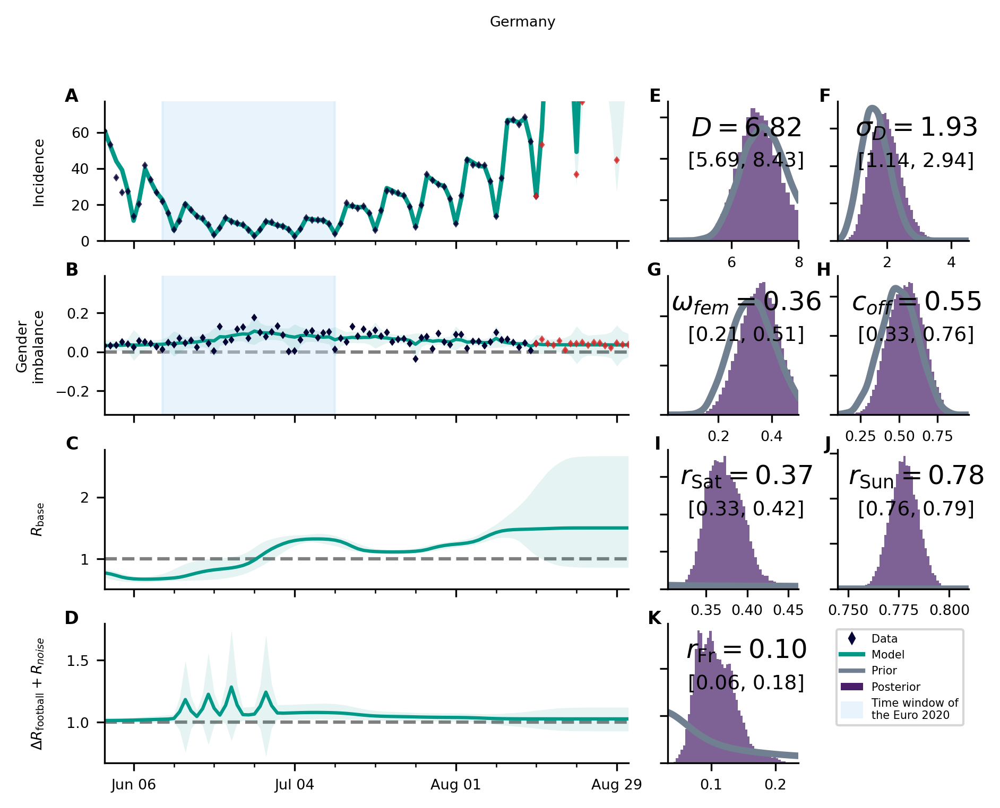

/home/smohr/Repositories/covid19_soccer/notebooks/supplementary/robustness/../../../covid19_soccer/plot/other.py:1254: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  lines.append(Patch([0], [0], color=rcParams.color_posterior, lw=0,),)
/home/smohr/Repositories/covid19_soccer/notebooks/supplementary/robustness/../../../covid19_soccer/plot/other.py:1254: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  lines.append(Patch([0], [0], color=rcParams.color_posterior, lw=0,),)


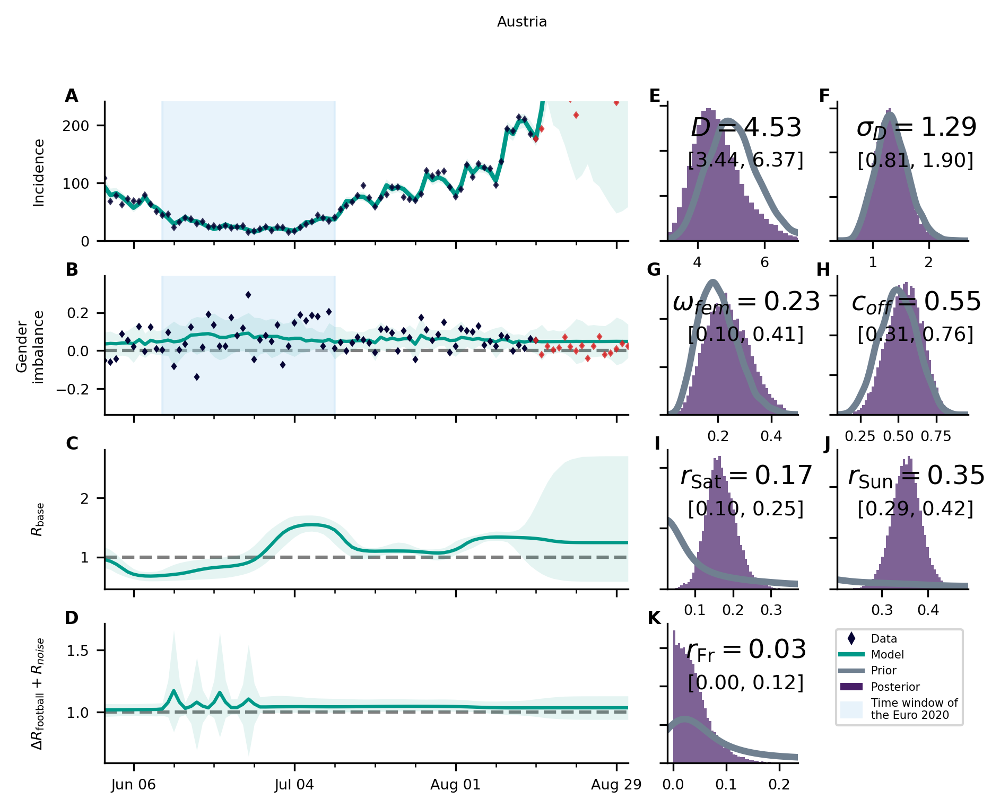

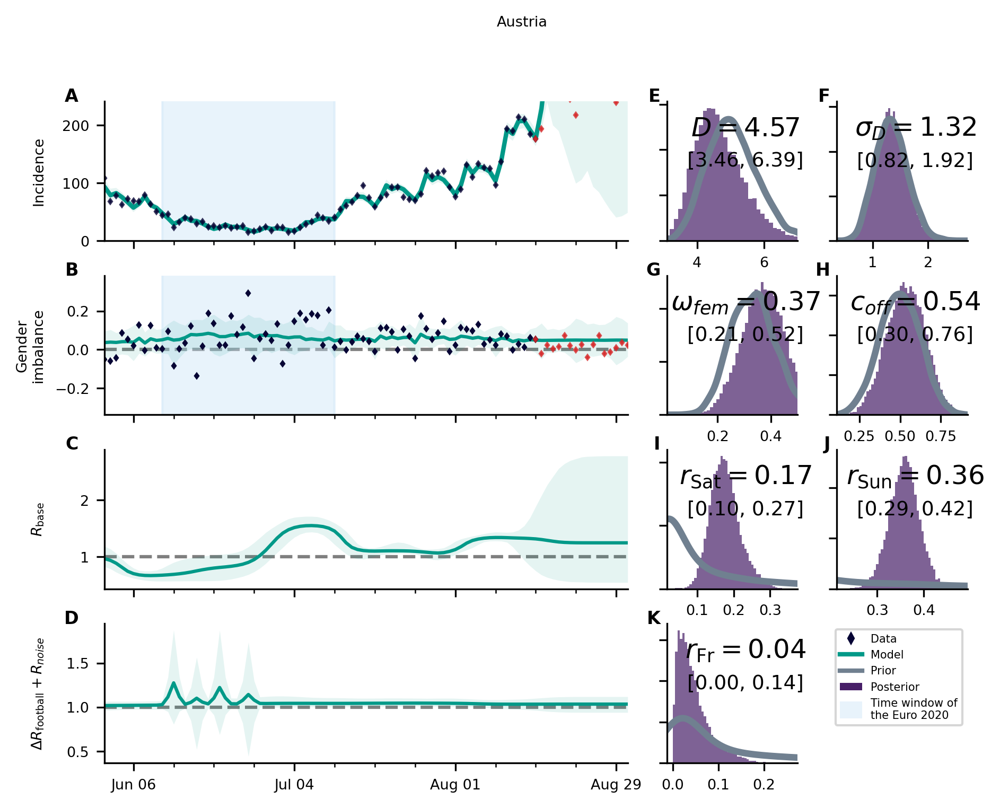

/home/smohr/Repositories/covid19_soccer/notebooks/supplementary/robustness/../../../covid19_soccer/plot/other.py:1254: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  lines.append(Patch([0], [0], color=rcParams.color_posterior, lw=0,),)
/home/smohr/Repositories/covid19_soccer/notebooks/supplementary/robustness/../../../covid19_soccer/plot/other.py:1254: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  lines.append(Patch([0], [0], color=rcParams.color_posterior, lw=0,),)


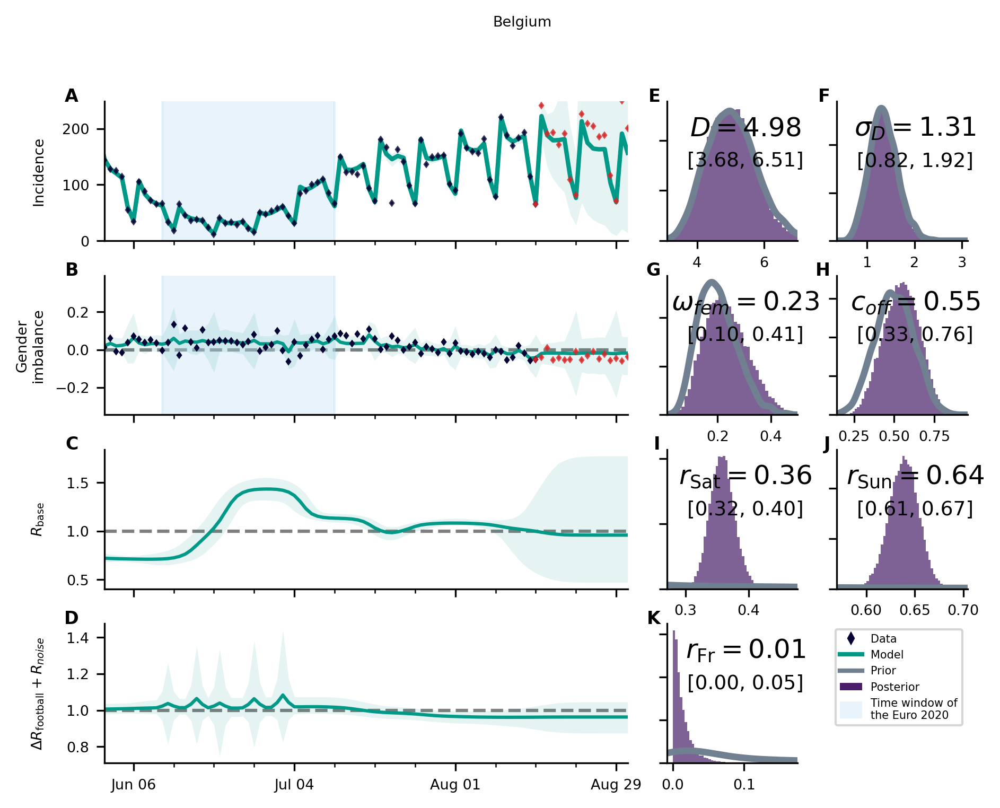

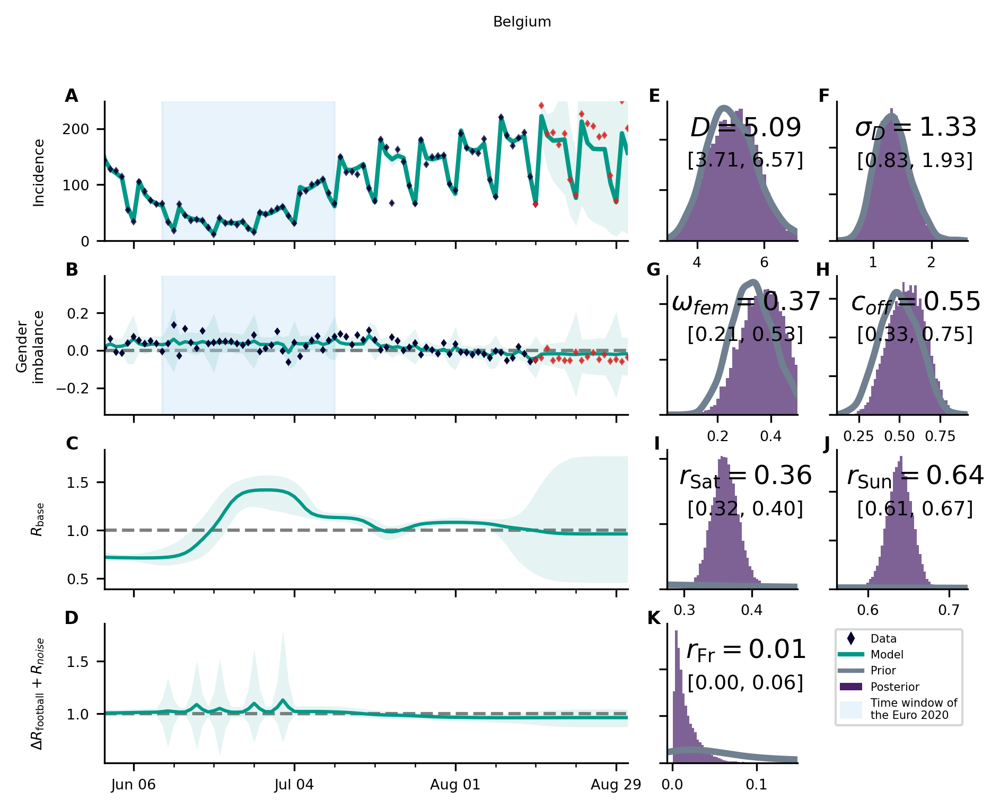

/home/smohr/Repositories/covid19_soccer/notebooks/supplementary/robustness/../../../covid19_soccer/plot/other.py:1254: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  lines.append(Patch([0], [0], color=rcParams.color_posterior, lw=0,),)
/home/smohr/Repositories/covid19_soccer/notebooks/supplementary/robustness/../../../covid19_soccer/plot/other.py:1254: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  lines.append(Patch([0], [0], color=rcParams.color_posterior, lw=0,),)


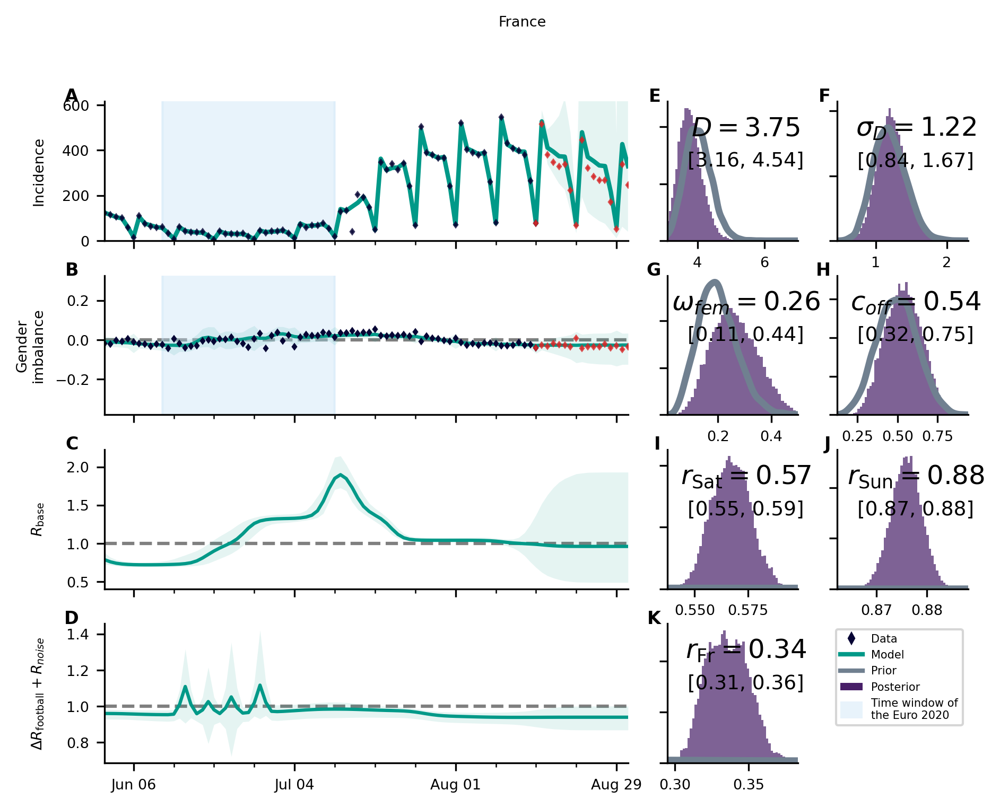

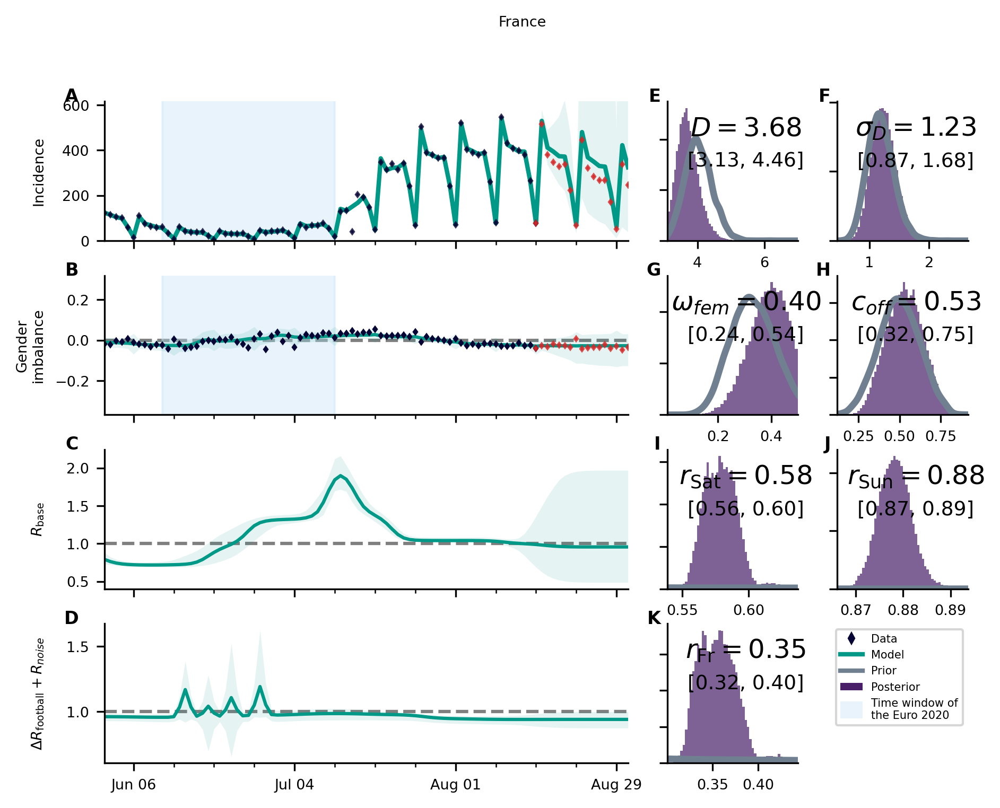

/home/smohr/Repositories/covid19_soccer/notebooks/supplementary/robustness/../../../covid19_soccer/plot/other.py:1254: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  lines.append(Patch([0], [0], color=rcParams.color_posterior, lw=0,),)
/home/smohr/Repositories/covid19_soccer/notebooks/supplementary/robustness/../../../covid19_soccer/plot/other.py:1254: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  lines.append(Patch([0], [0], color=rcParams.color_posterior, lw=0,),)


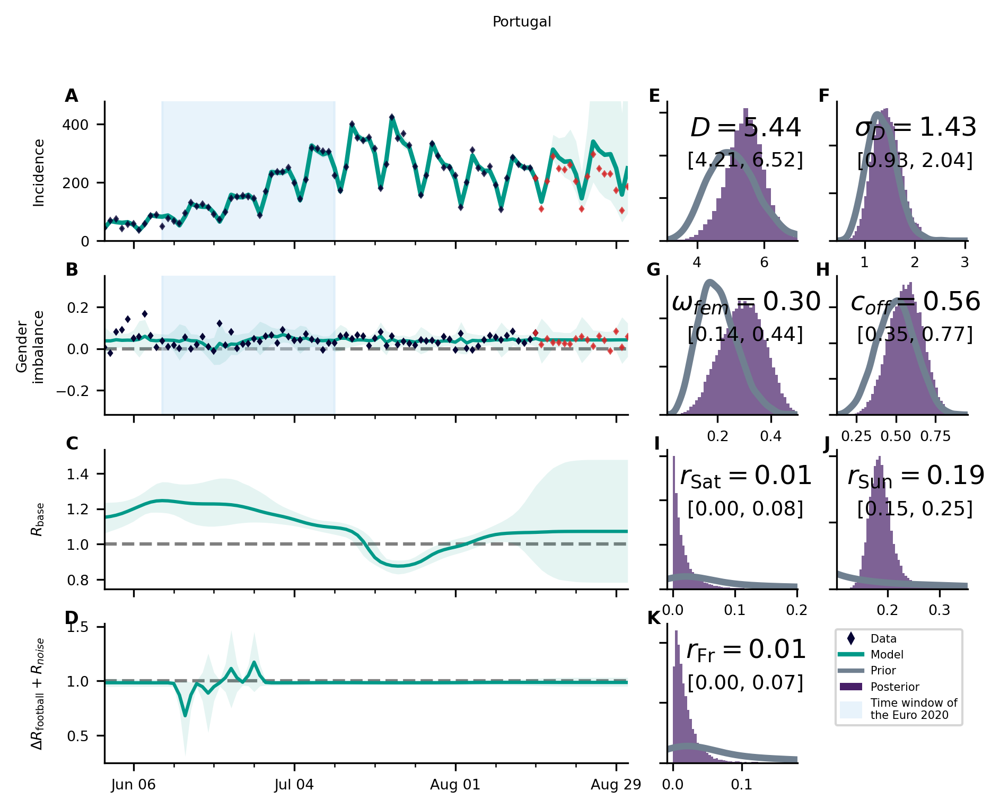

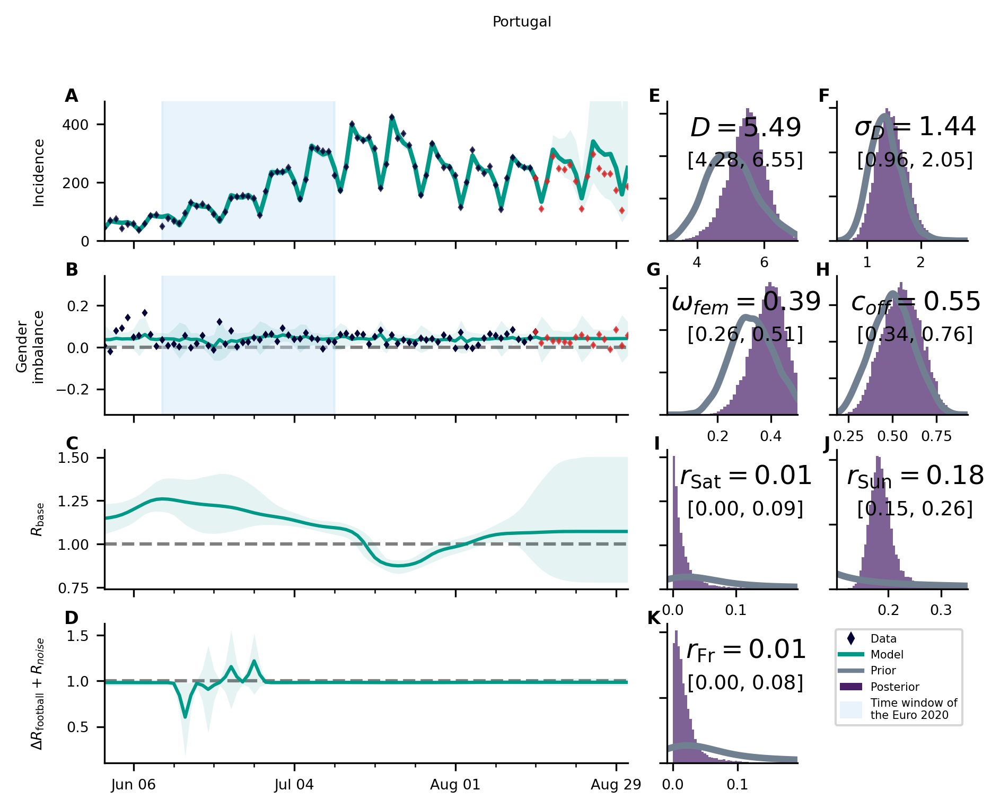

/home/smohr/Repositories/covid19_soccer/notebooks/supplementary/robustness/../../../covid19_soccer/plot/other.py:1254: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  lines.append(Patch([0], [0], color=rcParams.color_posterior, lw=0,),)
/home/smohr/Repositories/covid19_soccer/notebooks/supplementary/robustness/../../../covid19_soccer/plot/other.py:1254: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  lines.append(Patch([0], [0], color=rcParams.color_posterior, lw=0,),)


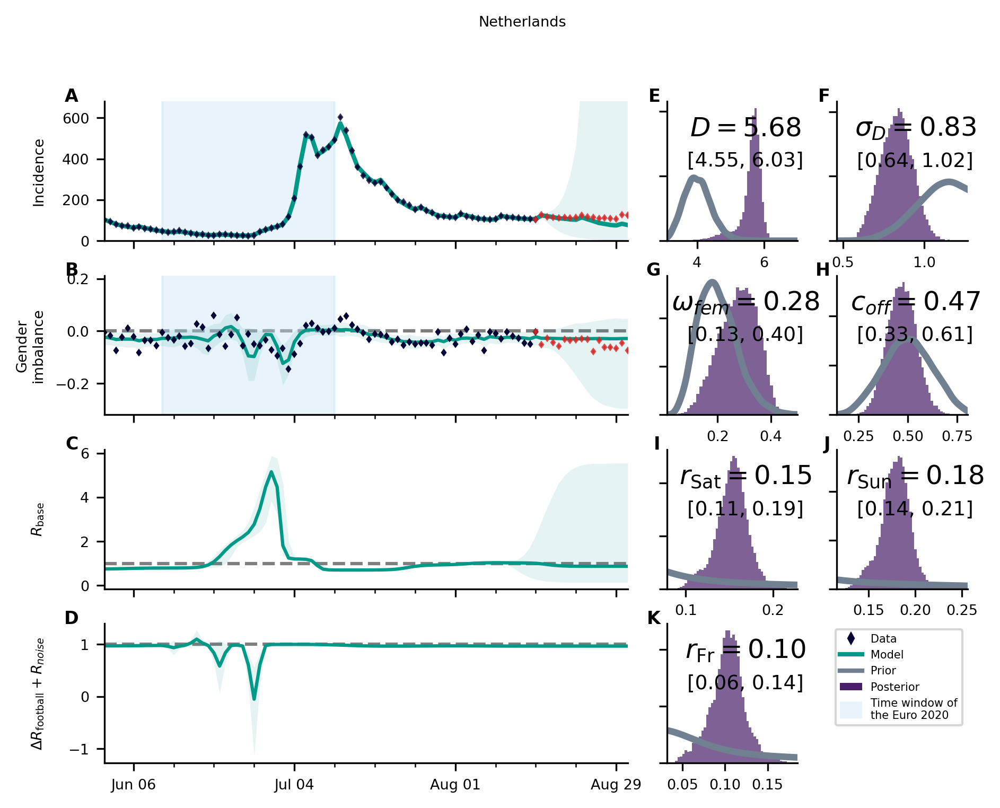

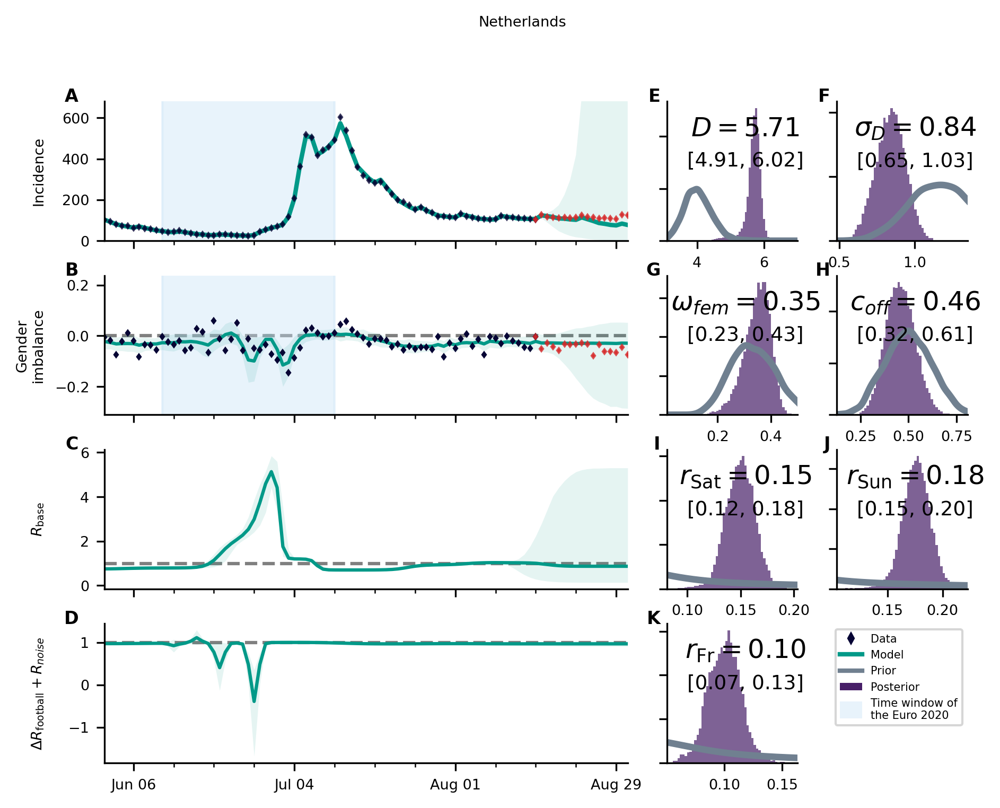

In [7]:
from covid19_soccer.plot.overview import single_extended
for trace,model,dl in zip(traces.values(),models.values(),dls.values()):
    
    fig0 = single_extended(trace[0],model[0],dl[0])
    fig0.suptitle(f"{dl[0].countries[0]}")
    fig1 = single_extended(trace[1],model[1],dl[1])
    fig1.suptitle(f"{dl[1].countries[0]}")
    plt.show()
    plt.close(fig=fig0)
    plt.close(fig=fig1)

In [8]:
%load_ext watermark
%watermark -n -u -v -iv -w

Last updated: Mon Oct 17 2022

Python implementation: CPython
Python version       : 3.8.10
IPython version      : 7.24.1

numpy            : 1.20.3
pandas           : 1.2.4
matplotlib       : 3.5.1
pymc3            : 3.11.2
arviz            : 0.11.4
covid19_inference: 0.3.6
sys              : 3.8.10 | packaged by conda-forge | (default, May 11 2021, 07:01:05) 
[GCC 9.3.0]

Watermark: 2.3.1

